<a href="https://colab.research.google.com/github/hitesh-c/fightdetection/blob/main/FightDetection_7thSem.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Connecting to google drive**

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

folderlocation = '/content/gdrive/MyDrive/Fight_Dataset/'

Mounted at /content/gdrive


# **Adding Libraries**

In [ ]:
import cv2
import math
import numpy as np
import random
import os

In [ ]:
import tensorflow 
import keras
from keras.layers import *
import matplotlib.pyplot as plt
plt.style.use("seaborn")
%matplotlib inline


# **Data Exploration**

In [ ]:
from IPython.display import HTML
from base64 import b64encode

# Function to Display Video
def DispVid(vidsrc):
    html = ''
    video = open(vidsrc,'rb').read()
    src = 'data:video/mp4;base64,' + b64encode(video).decode()
    html += '<video width=640 muted controls autoplay loop><source src="%s" type="video/mp4"></video>' % src 
    return HTML(html)

**Fight Video Display**

In [ ]:
DispVid(folderlocation+'Fight/V_241.mp4')

**Non-Fight Video Display**

In [ ]:
DispVid(folderlocation+'NoFight/NV_202.mp4')

# **Frame Extraction from videos**

In [ ]:
Categories = ["NoFight","Fight"]

# Video frames will be resized to these dimensions
Width, Height = 65, 65

# Number of frames to be given to the model as a sequence
No_of_frames = 15

def videotoframe(src):
 
    vidframe = []
    
    # Video Read
    video_reader = cv2.VideoCapture(src)
 
    # Returns total frame count in video
    video_frames_count = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))
 
    # Returns interval after which frames will be selected
    framestoskip = max(int(video_frames_count/No_of_frames), 1)
 
    # Processing frames
    for i in range(No_of_frames):
 
        # Set the current frame position of the video.
        video_reader.set(cv2.CAP_PROP_POS_FRAMES, i * framestoskip)
 
        # Frame reading. 
        success, frame = video_reader.read() 
 
        if not success:
            break
 
        # Frame resize
        resize_frame = cv2.resize(frame, (Height, Width))
        
        # Frame Normalization
        normalize_frame = resize_frame / 255
        
        # adding normalized frame to list
        vidframe.append(normalize_frame)
    
    video_reader.release()
 
    return vidframe

# **Training & Testing Data Formation**

In [ ]:
def form_data():

    pixels = []
    category = []
    
    # Iterating categories
    for category_index, category_name in enumerate(Categories):
        
        # List of videos present in the specific category
        videos_list = os.listdir(os.path.join(folderlocation, category_name))
        
        # Iterating videos
        for video_name in videos_list:
            
            # Complete video path
            video_file_path = os.path.join(folderlocation, category_name, video_name)
 
            # Frames Extraction
            frames = videotoframe(video_file_path)
 
            # if frames of video are less than No_of_frames specified, skip the video
            if len(frames) == No_of_frames:
 
                # Append the data to their repective lists.
                pixels.append(frames)
                category.append(category_index)
 
    # convert to numpy array
    pixels = np.asarray(pixels)
    category = np.array(category)  

    # category - [0 for Nofight] , [1 for Fight]
    return pixels, category

# dataset Formation
pixels, category = form_data()

In [ ]:
# Saving data
#np.save(folderlocation+"pixels.npy",pixels)
#np.save(folderlocation+"category.npy",category)

In [ ]:
#Loading data
pixels, category = np.load(folderlocation+"pixels.npy"), np.load(folderlocation+"category.npy")

# **Splitting Dataset**

In [ ]:
from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import to_categorical

# convert category in 2-d form
label2d = to_categorical(category)

# Splitting into Training - [0.8] and Testing - [0.2]
pixels_train, pixels_test, category_train, category_test = train_test_split(pixels, label2d, test_size = 0.20,
                                                                            shuffle = True, random_state = 15)

In [ ]:
print("Training Dataset :")
print("Pixels Dimensions: ",pixels_train.shape, "Category Dimensions: ", category_train.shape)
print()
print("Testing Dataset :")
print("Pixels Dimensions: ",pixels_test.shape,"Category Dimensions: ", category_test.shape)

Training Dataset :
Pixels Dimensions:  (1606, 15, 65, 65, 3) Category Dimensions:  (1606, 2)

Testing Dataset :
Pixels Dimensions:  (402, 15, 65, 65, 3) Category Dimensions:  (402, 2)


# **Adding MobileNet Model**

In [ ]:
from keras.applications.mobilenet_v2 import MobileNetV2

mbnetmodel = MobileNetV2(include_top=False , weights="imagenet")

# Making last 40 layers trainable
mbnetmodel.trainable=True

for layer in mbnetmodel.layers[:-40]:
  layer.trainable=False

mbnetmodel.summary()

Model: "mobilenetv2_1.00_224"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, None, None,  0           []                               
                                 3)]                                                              
                                                                                                  
 Conv1 (Conv2D)                 (None, None, None,   864         ['input_2[0][0]']                
                                32)                                                               
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, None, None,   128         ['Conv1[0][0]']                  
                                32)                                            

# **Model Creation**

In [ ]:
from keras.models import Sequential

def generate_model():
 
    model = Sequential()
    
    #inputting image shape
    model.add(Input(shape = (No_of_frames, Height, Width, 3)))
    
    # Passing mobilenet in the TimeDistributed layer to handle the sequence
    model.add(TimeDistributed(mbnetmodel))
    
    model.add(Dropout(0.25))
                                    
    model.add(TimeDistributed(Flatten()))

    lstm_frwd = LSTM(units=32)
    lstm_bcwd = LSTM(units=32, go_backwards = True)  

    model.add(Bidirectional(lstm_frwd, backward_layer = lstm_bcwd))
    
    model.add(Dropout(0.25))

    model.add(Dense(256,activation='relu'))
    model.add(Dropout(0.25))

    model.add(Dense(128,activation='relu'))
    model.add(Dropout(0.25))

    model.add(Dense(64,activation='relu'))
    model.add(Dropout(0.25))

    model.add(Dense(32,activation='relu'))
    model.add(Dropout(0.25))
    
    
    model.add(Dense(len(Categories), activation = 'softmax'))
 
    model.summary()
    return model

Mobnet_LSTM_model = generate_model()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 time_distributed (TimeDistr  (None, 15, 2, 2, 1280)   2257984   
 ibuted)                                                         
                                                                 
 dropout (Dropout)           (None, 15, 2, 2, 1280)    0         
                                                                 
 time_distributed_1 (TimeDis  (None, 15, 5120)         0         
 tributed)                                                       
                                                                 
 bidirectional (Bidirectiona  (None, 64)               1319168   
 l)                                                              
                                                                 
 dropout_1 (Dropout)         (None, 64)                0         
                                                        

# **Defining Callbacks**

In [ ]:
from keras.callbacks import EarlyStopping

# Create Early Stopping Callback - minimize the loss by stopping training when metric has stopped improving
early_stopping = EarlyStopping(monitor = 'val_accuracy', patience = 9, restore_best_weights = True)

# Create ReduceLROnPlateau Callback - to reduce overfitting by reduce learning rate when a metric has stopped improving
Reduce_LROnPlateau = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss',factor=0.6,patience=5,min_lr=0.00005,verbose=1)

# **Model Fitting**

In [ ]:
# Model Compiling
Mobnet_LSTM_model.compile(loss = 'categorical_crossentropy', optimizer = 'sgd', metrics = ["accuracy"])

# Model Fitting
Mobnet_LSTM_model_history = Mobnet_LSTM_model.fit (x = pixels_train, y = category_train, epochs = 80, 
                                                   batch_size = 8 , shuffle = True, validation_split = 0.2, 
                                                   callbacks = [early_stopping,Reduce_LROnPlateau] )
Mobnet_LSTM_model_history = Mobnet_LSTM_model_history.history

NameError: ignored

In [ ]:
Mobnet_LSTM_model.save(folderlocation+'Mobnet_LSTM_model')
np.save(folderlocation+'Mobnet_LSTM_model_history.npy',Mobnet_LSTM_model_history)

In [ ]:
#Mobnet_LSTM_model = tf.keras.models.load_model(folderlocation+'Mobnet_LSTM_model')
#Mobnet_LSTM_model_history = np.load(folderlocation+'Mobnet_LSTM_model_history.npy',allow_pickle='TRUE').item()

In [ ]:
Mobnet_LSTM_model.evaluate(pixels_test, category_test)

13/13 [==============================] - 12s 113ms/step - loss: 0.2367 - accuracy: 0.9229


[0.23673449456691742, 0.9228855967521667]

# **Model Evaluation**

In [ ]:
def draw_graph(history_model, param1, param2, graph_name):
    
    param_val1 = history_model[param1]
    param_val2 = history_model[param2]
    
    # Count of Epochs to be plotted
    epochs = range(len(param_val1))
 
    plt.plot(epochs, param_val1, 'red', label = param1)
    plt.plot(epochs, param_val2, 'yellow', label = param2)
    plt.title(str(graph_name))
    plt.legend()

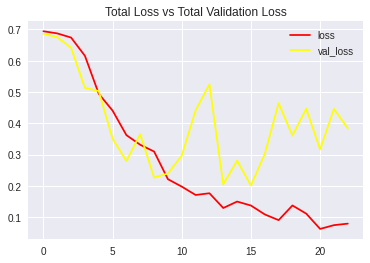

In [ ]:
draw_graph(Mobnet_LSTM_model_history, 'loss', 'val_loss', 'Total Loss vs Total Validation Loss')

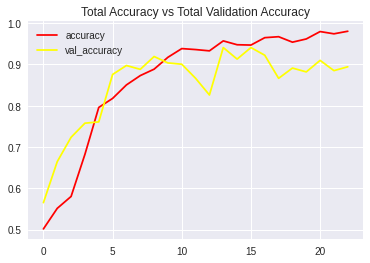

In [ ]:
draw_graph(Mobnet_LSTM_model_history, 'accuracy', 'val_accuracy', 'Total Accuracy vs Total Validation Accuracy')

# **Checking on Testing Data & Computing Accuracy**

In [ ]:
predicted_cat = Mobnet_LSTM_model.predict(pixels_test)
predicted_cat = np.argmax(predicted_cat , axis=1)
original_cat = np.argmax(category_test , axis=1)
print("Original Category dimensions: ",original_cat.shape , " Predicted Category dimensions: ", predicted_cat.shape)

13/13 [==============================] - 3s 64ms/step
Original Category dimensions:  (402,)  Predicted Category dimensions:  (402,)


In [ ]:
from sklearn.metrics import accuracy_score
AccuracyScore = accuracy_score(predicted_cat, original_cat)
print('Accuracy on Testing Data : ', AccuracyScore*100 , " %")

Accuracy on Testing Data :  92.28855721393035  %


 **Confusion Matrix**

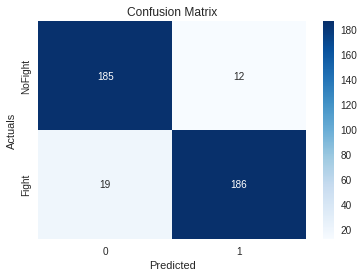

In [ ]:
import seaborn as sns 
from sklearn.metrics import confusion_matrix

ax = plt.subplot()
cm = confusion_matrix(original_cat, predicted_cat)
sns.heatmap(cm, annot=True, fmt='g', ax=ax,cmap="Blues");
ax.set_xlabel('Predicted');ax.set_ylabel('Actuals'); 
ax.set_title('Confusion Matrix');
ax.yaxis.set_ticklabels(['NoFight', 'Fight']);

**Classification Report**

In [ ]:
from sklearn.metrics import classification_report

Report = classification_report(original_cat, predicted_cat, target_names=['NoFight','Fight'])
print('Classification Report: \n', Report)

#Precision = TP/TP+FP
#Recall = TP/TP+FN
#F1 Score = 2*(Recall * Precision) / (Recall + Precision)


Classification Report: 
               precision    recall  f1-score   support

     NoFight       0.91      0.94      0.92       197
       Fight       0.94      0.91      0.92       205

    accuracy                           0.92       402
   macro avg       0.92      0.92      0.92       402
weighted avg       0.92      0.92      0.92       402



# **Video Prediction with Labelling**

---



In [ ]:
def label_predict(video_src, No_of_frames):

    video_reader = cv2.VideoCapture(video_src)
 
    # store video width and height
    video_width = int(video_reader.get(cv2.CAP_PROP_FRAME_WIDTH))
    video_height = int(video_reader.get(cv2.CAP_PROP_FRAME_HEIGHT))
                                   
    frames_list = []
    predicted_category_name = ''
 
    # store video frames count
    video_frames = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))
 
    # Interval after which frames will be added to the list
    skip_frames_window = max(int(video_frames/No_of_frames),1)
 
    # Iteration on frames
    for i in range(No_of_frames):
 
        # process current frame
        video_reader.set(cv2.CAP_PROP_POS_FRAMES, i * skip_frames_window)
        success, frame = video_reader.read() 

        if not success:
            break
 
        # Frame resize for processing
        resized_frame = cv2.resize(frame, (Height, Width))
        
        # Frame normalization
        normalized_frame = resized_frame / 255
        
        # Add to frames list
        frames_list.append(normalized_frame)
 
    # Passing the normalized frames to the model to get category.
    category_probabilities = Mobnet_LSTM_model.predict(np.expand_dims(frames_list, axis = 0))[0]
 
    # Get the index of class with highest probability.
    predicted_label = np.argmax(category_probabilities)
 
    # Get the class name using the retrieved index.
    predicted_class_name = Categories[predicted_label]
    
    # Display the predicted class along with the prediction confidence.
    print(f'Predicted: {predicted_class_name}\nConfidence: {category_probabilities[predicted_label]}')
        
    video_reader.release()

In [ ]:
# Video to predict
video_src = folderlocation + "Fight/V_276.mp4"
label_predict(video_src, No_of_frames)
# Play video
DispVid(video_src)

1/1 [==============================] - 0s 364ms/step
Predicted: Fight
Confidence: 0.9972391128540039


In [ ]:
# Video to predict
video_src = folderlocation + "NoFight/NV_32.mp4"
label_predict(video_src, No_of_frames)

# Play video
DispVid(video_src)

1/1 [==============================] - 0s 25ms/step
Predicted: NoFight
Confidence: 0.9999083280563354


# **Final Production: Designing API for practical use**

---

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

folderlocation = '/content/gdrive/MyDrive/Fight_Dataset/'

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [ ]:
!pip install colabcode

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 8.3 MB 11.8 MB/s 
     |████████████████████████████████| 761 kB 62.8 MB/s 
     |████████████████████████████████| 45 kB 4.1 MB/s 
     |████████████████████████████████| 346 kB 73.3 MB/s 
     |████████████████████████████████| 9.8 MB 80.5 MB/s 
     |████████████████████████████████| 54 kB 2.6 MB/s 
     |████████████████████████████████| 423 kB 77.9 MB/s 
     |████████████████████████████████| 58 kB 6.3 MB/s 
     |████████████████████████████████| 55 kB 4.8 MB/s 
     |████████████████████████████████| 80 kB 11.4 MB/s 
     |████████████████████████████████| 273 kB 79.3 MB/s 
     |████████████████████████████████| 133 kB 80.5 MB/s 
     |████████████████████████████████| 9.8 MB 26.8 MB/s 
     |████████████████████████████████| 9.8 MB 57.5 MB/s 
     |████████████████████████████████| 9.8 MB 69.4 MB/s 
     |████████████████████████████████| 

In [ ]:
!pip install fastapi

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 55 kB 1.2 MB/s 
     |████████████████████████████████| 64 kB 1.5 MB/s 


In [ ]:
import cv2
import math
import numpy as np
import random
import os
import tensorflow 
import keras
from keras.layers import *
import matplotlib.pyplot as plt
plt.style.use("seaborn")
%matplotlib inline

In [ ]:
Categories = ["NoFight","Fight"]

Width, Height = 65, 65

def model_predict(video_src, No_of_frames):

    video_reader = cv2.VideoCapture(video_src) #can capture URL
 
    # store video width and height
    video_width = int(video_reader.get(cv2.CAP_PROP_FRAME_WIDTH))
    video_height = int(video_reader.get(cv2.CAP_PROP_FRAME_HEIGHT))
                                   
    frames_list = []
    predicted_category_name = ''
 
    # store video frames count
    video_frames = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))
 
    # Interval after which frames will be added to the list
    skip_frames_window = max(int(video_frames/No_of_frames),1)
 
    # Iteration on frames
    for i in range(No_of_frames):
 
        # process current frame
        video_reader.set(cv2.CAP_PROP_POS_FRAMES, i * skip_frames_window)
        success, frame = video_reader.read() 

        if not success:
            return {'Predicted': 'NA'}
            break
 
        # Frame resize for processing
        resized_frame = cv2.resize(frame, (Height, Width))
        
        # Frame normalization
        normalized_frame = resized_frame / 255
        
        # Add to frames list
        frames_list.append(normalized_frame)
 
    # Passing the normalized frames to the model to get category.
    category_probabilities = Mobnet_LSTM_model.predict(np.expand_dims(frames_list, axis = 0))[0]
 
    # Get the index of class with highest probability.
    predicted_label = np.argmax(category_probabilities)
 
    # Get the class name using the retrieved index.
    predicted_class_name = Categories[predicted_label]
    
    # Return the predicted class
    return {'Predicted': predicted_class_name }
        
    video_reader.release()

In [ ]:
from pydantic import BaseModel

class URL(BaseModel):
    src: str
    frames : int 
    class Config:
        schema_extra = {
            "example": {
                "src": folderlocation + "NoFight/NV_32.mp4",
                "frames" : 15 
            }
        }

In [ ]:
from fastapi import FastAPI

app = FastAPI()

@app.on_event("startup")
def load_model():
    global Mobnet_LSTM_model
    Mobnet_LSTM_model = tf.keras.models.load_model(folderlocation+'Mobnet_LSTM_model')

@app.get('/')
def index():
    return {'message': 'Welcome to Fight detection system, This is the homepage of the API '}


@app.post('/predict')
def get_src_category(data: URL):
    received = data.dict()
    video_src = received['src']
    No_of_frames = received['frames']
    No_of_frames = 15
    pred = model_predict(video_src, No_of_frames)
    return pred

SAMPLE JSON:
```JSON
{
  "src":"/content/gdrive/MyDrive/Fight_Dataset/Fight/V_10.mp4",
  "frames":15
}

```



In [ ]:
from colabcode import ColabCode
server = ColabCode(port=10000, code=False)

In [ ]:
server.run_app(app=app)

Public URL: NgrokTunnel: "https://cf27-34-90-41-127.ngrok.io" -> "http://localhost:10000"


INFO:     Started server process [75]
INFO:uvicorn.error:Started server process [75]
INFO:     Waiting for application startup.
INFO:uvicorn.error:Waiting for application startup.
INFO:     Application startup complete.
INFO:uvicorn.error:Application startup complete.
INFO:     Uvicorn running on http://127.0.0.1:10000 (Press CTRL+C to quit)
INFO:uvicorn.error:Uvicorn running on http://127.0.0.1:10000 (Press CTRL+C to quit)


1/1 [==============================] - 2s 2s/step
INFO:     117.206.212.175:0 - "POST /predict HTTP/1.1" 200 OK


INFO:     Shutting down
INFO:uvicorn.error:Shutting down
INFO:     Waiting for application shutdown.
INFO:uvicorn.error:Waiting for application shutdown.
INFO:     Application shutdown complete.
INFO:uvicorn.error:Application shutdown complete.
INFO:     Finished server process [75]
INFO:uvicorn.error:Finished server process [75]


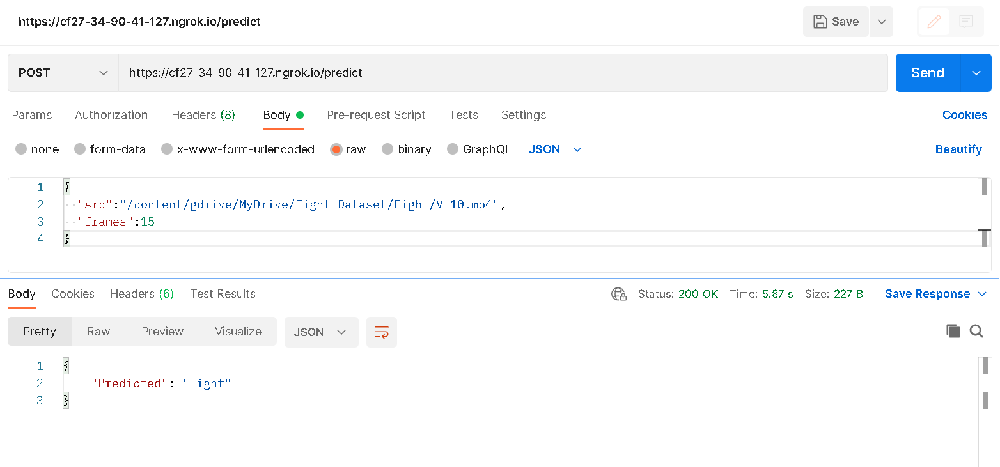